# Process the frames data to compute a pose manifold, and to run classification

In [63]:
import h5py
import joblib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.auto import tqdm
from toolz import compose, curry, partial, valmap
from aging.size_norm.data import clean
from aging.organization.ontogeny import age_map_male
from aging.behavior.scalars import im_moment_features
from scipy.ndimage import gaussian_filter, rotate, shift
from sklearn.decomposition import PCA

In [2]:
version = 6
path = Path(
    f"/n/groups/datta/win/longtogeny/data/ontogeny/version_{version:02d}/all_data_pca/Ontogeny_males"
)

In [3]:
recon_key = "win_size_norm_frames_v5"


def get_uuid(path):
    with h5py.File(path, "r") as h5f:
        return h5f["metadata/uuid"][()].decode()


def check_session(path):
    try:
        return get_uuid(path) not in exclusion_uuids
    except BlockingIOError:
        return False


def has_key(path):
    try:
        with h5py.File(path, "r") as h5f:
            return recon_key in h5f.keys()
    except BlockingIOError:
        return False


def multi_filter(*filters, seq):
    return compose(*(curry(filter)(f) for f in filters))(seq)

In [4]:
session_exclusion_list = "/n/groups/datta/win/longtogeny/data/metadata/Ontogeny experiment list - Session quality control.csv"
exclusion_df = pd.read_csv(session_exclusion_list, header=0)
exclusion_df["Keep?"] = exclusion_df["Keep?"].str.lower()
exclusions = exclusion_df.query('`Keep?` != "y"')

In [5]:
exclusion_uuids = list(map(get_uuid, exclusions["File path"].values))
exclusion_uuids.append('b365ea6a-369f-4991-b139-15694dc1c86d')
exclusion_uuids.append('a85e0616-6a5b-4dd8-a2d6-51701084c25e')
files = sorted(multi_filter(has_key, check_session, seq=path.glob("*.h5")))

In [6]:
sessions_df = []
for f in tqdm(files):
    with h5py.File(f, "r") as h5f:
        sessions_df.append(
            dict(
                area=np.median(h5f["scalars/area_px"]),
                session=h5f["metadata/acquisition/SessionName"][()].decode(),
                subject=h5f["metadata/acquisition/SubjectName"][()].decode(),
                uuid=h5f["metadata/uuid"][()].decode(),
                file=str(f),
            )
        )

sessions_df = pd.DataFrame(sessions_df)
sessions_df["age"] = sessions_df["session"].map(age_map_male).astype("int")
sessions_df = sessions_df.dropna()
sessions_df = sessions_df[~sessions_df["session"].str.contains("CRL")]

  0%|          | 0/207 [00:00<?, ?it/s]

In [7]:
super_clean = partial(clean, height_thresh=14, tail_ksize=7, dilation_ksize=4)


def alignment_function(frame, recon_frame):
    frame = super_clean(frame)
    filt_frame = gaussian_filter(frame.astype("float32"), 13)
    filt_recon_frame = gaussian_filter(recon_frame.astype("float32"), 13)

    raw_peak = np.array(np.unravel_index(np.argmax(filt_frame), filt_frame.shape))
    recon_peak = np.array(
        np.unravel_index(np.argmax(filt_recon_frame), filt_recon_frame.shape)
    )

    translated = shift(frame, recon_peak - raw_peak)

    moments = im_moment_features(translated)
    if moments is None:
        return frame
    return rotate(
        translated, -np.rad2deg(moments["orientation"]), reshape=False
    ).astype("uint8")

In [8]:
selected = sessions_df.groupby('age').sample(n=11, random_state=0)

In [9]:
selected.query('age == 90')

,area,session,subject,uuid,file,age
145,720.0,ontogney_males_90w,c03_m01_b01,8fe3d0ef-bfda-405d-8077-ed767dd9146e,/n/groups/datta/win/longtogeny/data/ontogeny/v...,90
139,858.0,ontogeny_males_90w,c01_m02_b02,fffeff2c-94ab-42aa-ab9a-420a58e32679,/n/groups/datta/win/longtogeny/data/ontogeny/v...,90
147,881.0,ontogeny_males_90w,c03_m04_b04,791599d2-5a73-485b-8d0e-3be0a239f8ea,/n/groups/datta/win/longtogeny/data/ontogeny/v...,90
148,927.0,ontogeny_males_90w,c04_m04_b04,b0c2ea14-f73c-4922-b1bc-099fa0b9f5aa,/n/groups/datta/win/longtogeny/data/ontogeny/v...,90
146,836.0,ontogeny_males_90w,c03_m02_b02,1eaa4d25-6b26-458e-99cd-9921cb6d4419,/n/groups/datta/win/longtogeny/data/ontogeny/v...,90
144,805.0,ontogeny_males_90w,c02_m04_b04,273be8ab-3db6-4d39-a9f9-aed73bf3c7bd,/n/groups/datta/win/longtogeny/data/ontogeny/v...,90
138,894.0,ontogeny_males_90w,c01_m03_b03,b7b7dfa0-66e1-4f48-a118-2fec4b8ce144,/n/groups/datta/win/longtogeny/data/ontogeny/v...,90
142,894.0,ontogeny_males_90w,c02_m02_b02,4062899e-1951-4dae-be0f-2091bbd93b8e,/n/groups/datta/win/longtogeny/data/ontogeny/v...,90
143,830.0,ontogeny_males_90w,c02_m03_b03,0278ad72-da90-4ca6-b7a3-ba05df7e0751,/n/groups/datta/win/longtogeny/data/ontogeny/v...,90
150,943.0,ontogeny_males_90w,c04_m02_b02,7a5f5257-fd29-4451-9680-b2cee905c337,/n/groups/datta/win/longtogeny/data/ontogeny/v...,90


In [ ]:
n_frames = 12_500

all_frames = {}
all_recon_frames = {}
for idx, (idx, row) in enumerate(tqdm(selected.iterrows())):
    with h5py.File(row.file, "r") as h5f:
        recon_frames = h5f[recon_key][:n_frames].astype("uint8")
        all_frames[(idx, row.uuid, row.file, row.age)] = np.array(
            [
                alignment_function(f, r)
                for f, r in zip(h5f["frames"][:n_frames], recon_frames)
            ]
        )
        all_recon_frames[(idx, row.uuid, row.file, row.age)] = recon_frames

joblib.dump(
    dict(frames=all_frames, recon=all_recon_frames),
    "/n/scratch3/users/w/wg41/aging-aligned-frames.p",
)

0it [00:00, ?it/s]

## K-Means cluster pose

In [7]:
from sklearn.cluster import k_means, KMeans

In [3]:
def flatten(x):
    return x.reshape(len(x), -1)


def subsample(data, subset=200):
    np.random.seed(seed)
    sample = []
    for k, v in data.items():
        sample.append(v[np.random.permutation(np.arange(len(v)))[:subset]])
    return np.concatenate(sample, axis=0)


def multi_stage_pca(data, subset_frames=200, total_frames=7000, seed=0):
    np.random.seed(seed)

    train = []
    for k, v in data.items():
        train.append(v[np.random.permutation(np.arange(len(v)))[:subset_frames]])
    train = np.concatenate(train, axis=0)

    pca = PCA(n_components=10).fit(train.reshape(len(train), -1))

    pcs = valmap(
        compose(
            pca.transform,
            flatten,
            lambda v: v[np.random.permutation(np.arange(len(v)))[:total_frames]],
        ),
        data,
    )
    return pcs

In [4]:
data = joblib.load("/n/scratch3/users/w/wg41/aging-aligned-frames.p")

In [5]:
all_recon_frames = data['recon']

In [6]:
pcs = multi_stage_pca(all_recon_frames, total_frames=12_500, subset_frames=1000)

In [66]:
centroid, labels, inertia = k_means(
    np.concatenate(list(pcs.values()), axis=0), n_clusters=11, random_state=0
)

/home/wg41/miniconda3/envs/aging/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [67]:
unbatched_labels = {}
idx = 0
for k, v in pcs.items():
    unbatched_labels[k] = labels[idx:len(v)+idx]
    idx += len(v)

In [69]:
label_df = []
for k, v in unbatched_labels.items():
    label_df.append(pd.DataFrame(dict(age=k[-1], uuid=k[1], label=v)))
label_df = pd.concat(label_df).reset_index()

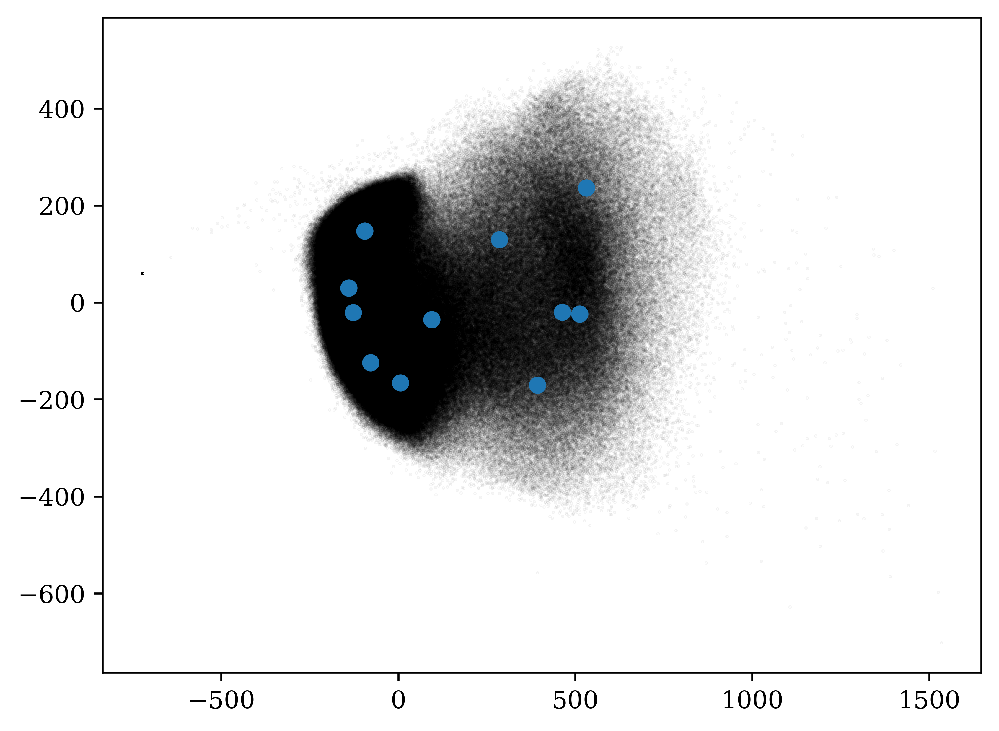

In [71]:
all_frames = np.concatenate(list(pcs.values()), axis=0)
plt.scatter(*all_frames[:, :2].T, s=0.1, alpha=0.05, color='k')
plt.scatter(*centroid[:, :2].T)

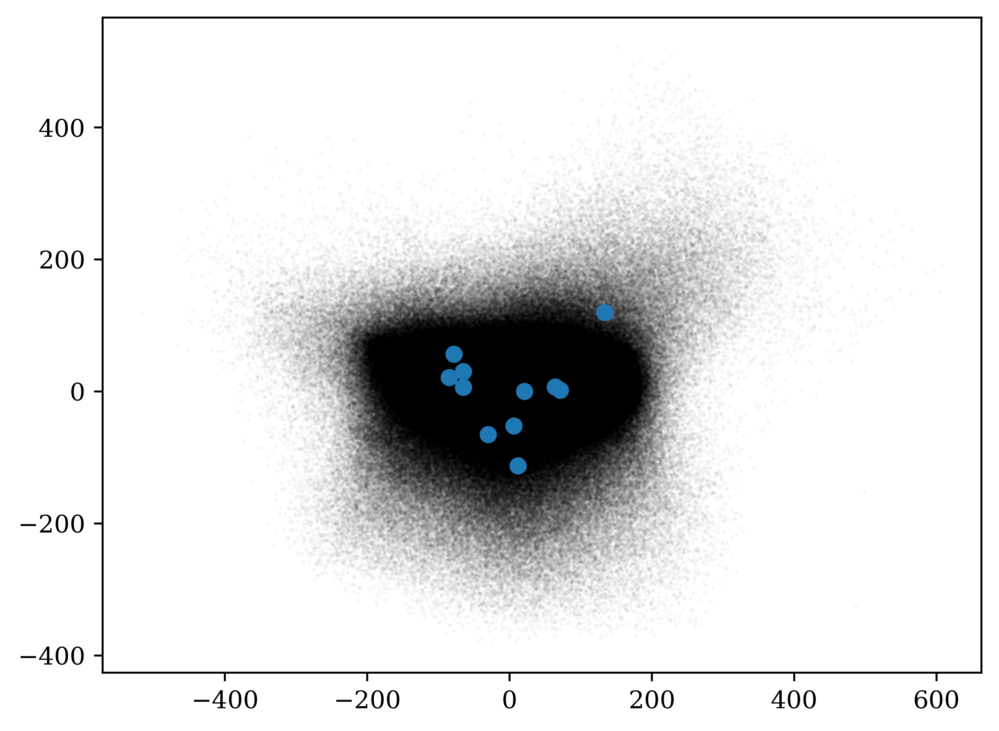

In [72]:
all_frames = np.concatenate(list(pcs.values()), axis=0)
plt.scatter(*all_frames[:, 2:4].T, s=0.1, alpha=0.05, color='k')
plt.scatter(*centroid[:, 2:4].T)

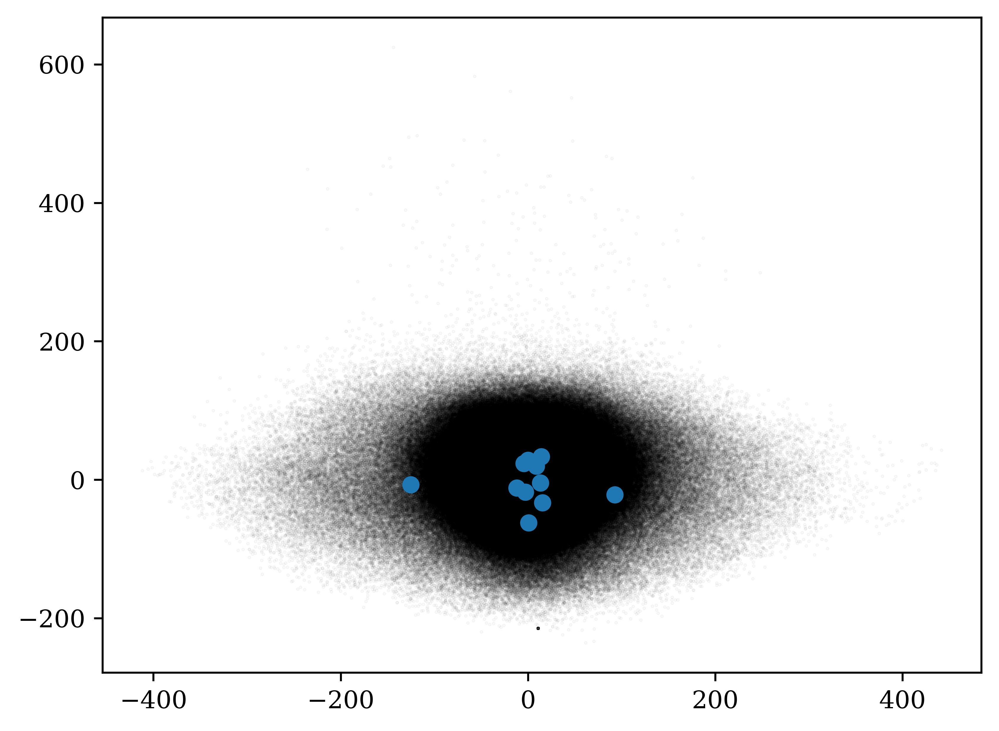

In [73]:
all_frames = np.concatenate(list(pcs.values()), axis=0)
plt.scatter(*all_frames[:, 4:6].T, s=0.1, alpha=0.05, color='k')
plt.scatter(*centroid[:, 4:6].T)

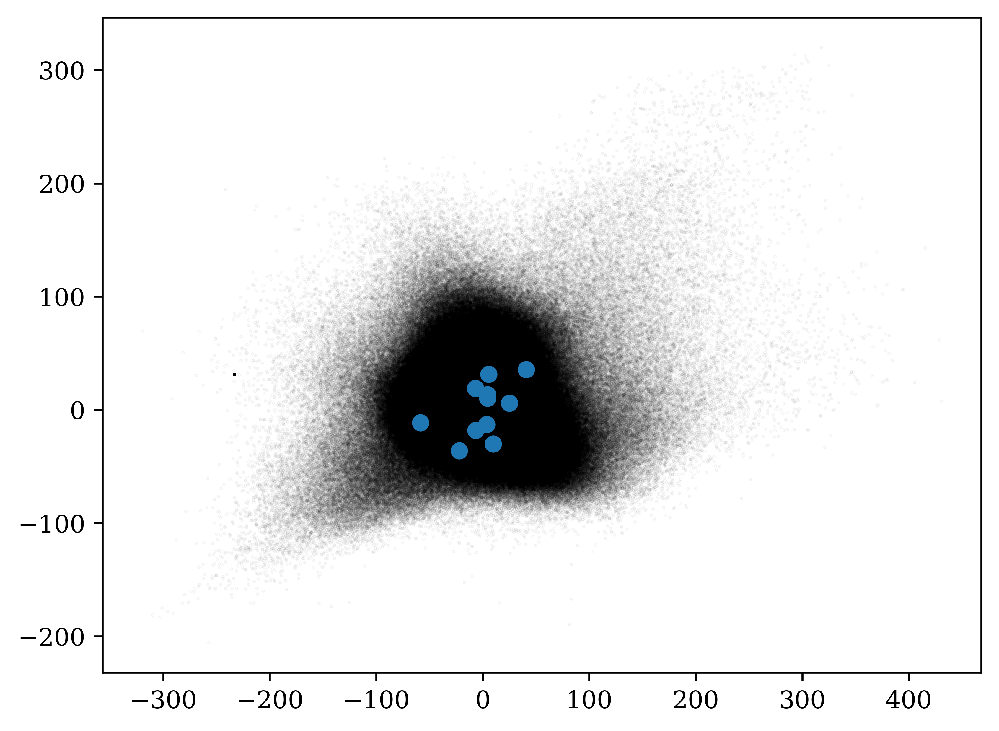

In [74]:
all_frames = np.concatenate(list(pcs.values()), axis=0)
plt.scatter(*all_frames[:, 6:8].T, s=0.1, alpha=0.05, color='k')
plt.scatter(*centroid[:, 6:8].T)

In [75]:
pose_freqs =  pd.pivot(label_df.groupby('age')['label'].value_counts().reset_index(), index='age', columns='label')

In [76]:
pose_freqs

count                                                                  
label     0     1      2      3      4     5      6     7      8     9      10
age                                                                           
3      29045   937  19239  10870  22499  4424   8369   989  24724  1822  14582
5      26823  1374  13446  17408  28694  4805   8978  2181  20535  2566  10690
7      33303  4406  10601  14570  19016  5028  14121  3502  20736  5487   6730
9      30901  3542  11224  19307  20675  4873  14054  2559  15876  5846   8643
12     23623  4687  11967  21473  21662  5356  14464  5098  17779  7001   4390
24     25111  5860   8437  27503  14472  3468  19491  5139  18185  7038   2796
36     26303  2901   9952  15404  26250  3238  12300  2587  31714  3799   3052
52     21980  7088   8532  21336  23524  3706  17162  5787  22458  4510   1417
78     23204  8548   7484  14372  30057  2509  12084  6397  29755  2350    740
90     17667  4163   7723   7371  30361  2192   7975  4196  52293  2977    582

<Axes: xlabel='None-label', ylabel='None-label'>

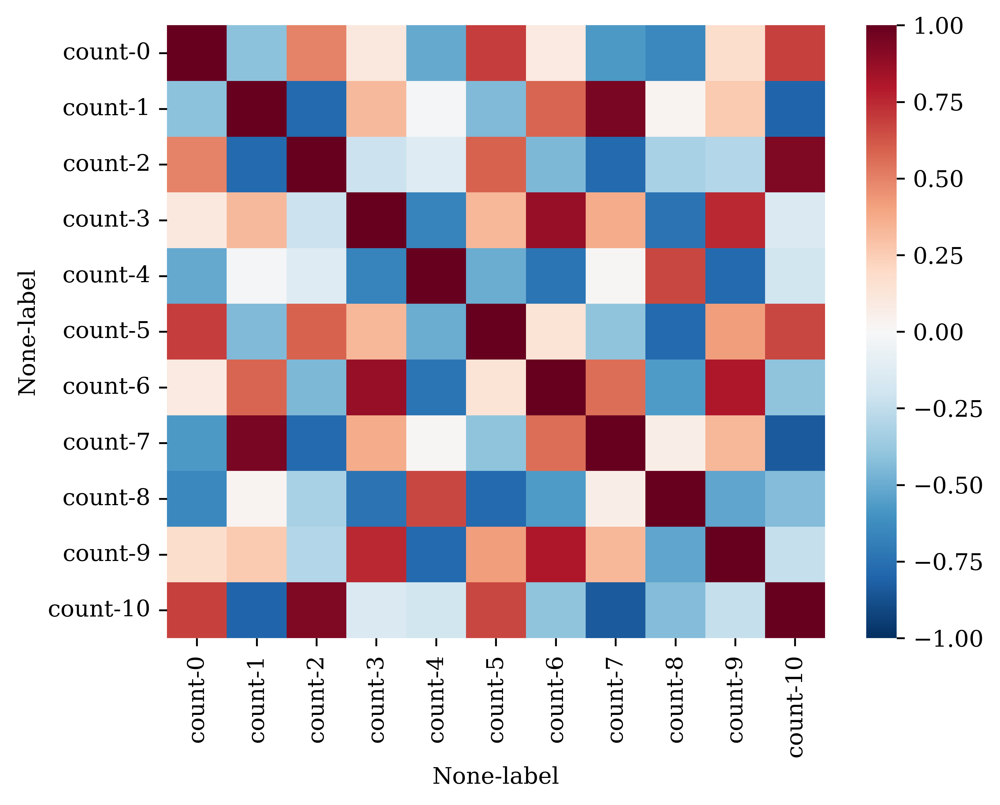

In [77]:
sns.heatmap(pose_freqs.corr(), cmap='RdBu_r', vmin=-1)

<Axes: xlabel='age'>

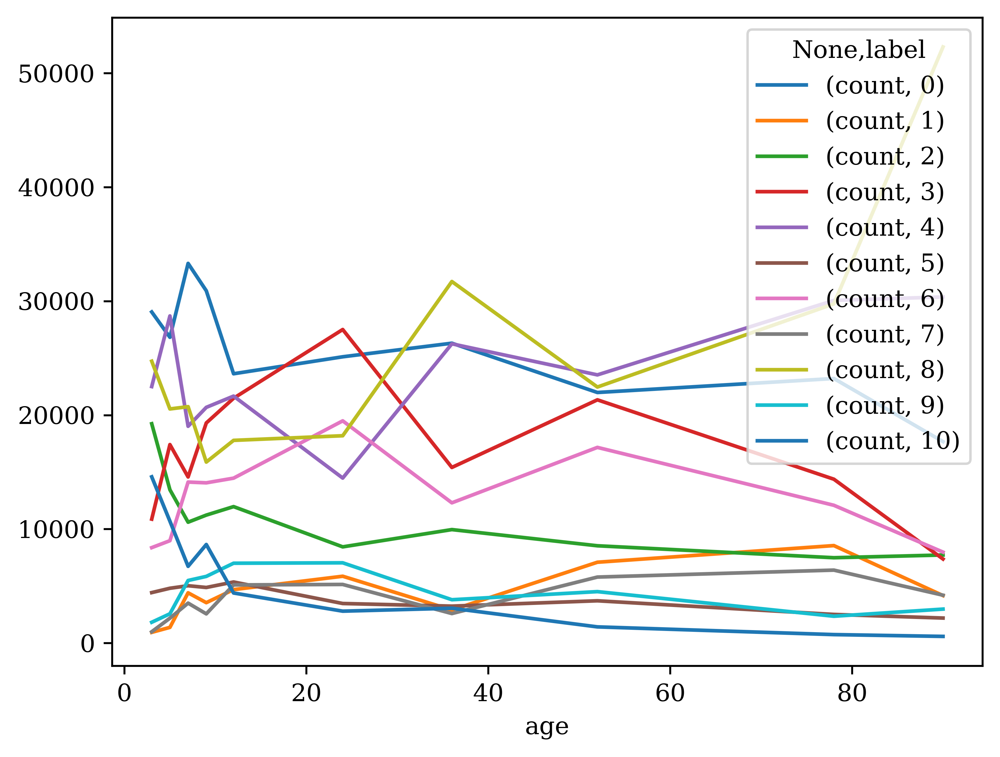

In [78]:
pose_freqs.plot()

In [84]:
pose_freqs.min(axis=1)

age
3      937
5     1374
7     3502
9     2559
12    4390
24    2796
36    2587
52    1417
78     740
90     582
dtype: int64

In [85]:
min_samples = 500

In [86]:
sample = label_df.groupby(['age', 'label'], sort=False).sample(n=min_samples)

In [92]:
sample = sample.sort_values(['age', 'uuid', 'index']).set_index(['age', 'uuid'])

In [98]:
sample 

index  label
age uuid                                              
3   0514b112-c12c-4785-84bd-93a8b40235e9     16      3
    0514b112-c12c-4785-84bd-93a8b40235e9     25      1
    0514b112-c12c-4785-84bd-93a8b40235e9     29      3
    0514b112-c12c-4785-84bd-93a8b40235e9     60      1
    0514b112-c12c-4785-84bd-93a8b40235e9     93      7
...                                         ...    ...
90  fffeff2c-94ab-42aa-ab9a-420a58e32679  12315      5
    fffeff2c-94ab-42aa-ab9a-420a58e32679  12377      2
    fffeff2c-94ab-42aa-ab9a-420a58e32679  12379      6
    fffeff2c-94ab-42aa-ab9a-420a58e32679  12406      1
    fffeff2c-94ab-42aa-ab9a-420a58e32679  12409      1

[55000 rows x 2 columns]

In [104]:
pose_samples_recon = {}
pose_samples = {}
for k, v in data['recon'].items():
    tmp = sample.loc[(k[-1], k[1])]
    pose_samples_recon[k] = v[tmp['index'].to_numpy()]
    pose_samples[k] = data['frames'][k][tmp['index'].to_numpy()]

In [106]:
joblib.dump(
    dict(frames=pose_samples, recon=pose_samples_recon),
    "/n/scratch3/users/w/wg41/aging-aligned-frames-pose-resampled.p",
    compress=1
)

['/n/scratch3/users/w/wg41/aging-aligned-frames-pose-resampled.p']